<div><img style="float: right; width: 120px; vertical-align:middle" src="https://www.upm.es/sfs/Rectorado/Gabinete%20del%20Rector/Logos/EU_Informatica/ETSI%20SIST_INFORM_COLOR.png" alt="ETSISI logo" />

# _Detecting and Classifying Traffic Signs Using Deep Learning_<a id="top"></a>

<i>Raúl Andrino Gómez & Antonio Reviejo González<br></i></div>
                                                  

---

# 1. Importación de Librerías

In [ ]:
import tensorflow as tf

from PIL import Image, ImageOps
from tensorflow.keras.applications import ResNet50
from tensorflow import keras
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPool2D, BatchNormalization, GlobalAveragePooling2D, MaxPooling2D
from collections import Counter
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from tensorflow.keras.utils import to_categorical
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import kagglehub
import pickle
import os
from ultralytics import YOLO

import warnings
warnings.filterwarnings("ignore")

# plt.style.use("ggplot")

# 2. Función para Dibujar

In [38]:
def plot(h, epochs, metric):
  LOSS= 0;ACCURACY= 1
  training = np.zeros((2,epochs)); testing = np.zeros((2,epochs))
  training[LOSS] = h['loss']
  testing[LOSS] = h['val_loss'] # validation loss
  training[ACCURACY] = h[metric]
  testing[ACCURACY] = h['val_'+ metric]
  epochs = range(1,epochs+1)
  fig,axs = plt.subplots(1,2, figsize=(17,5))
  for i , label in zip((LOSS, ACCURACY),('loss',metric)):
    axs[i].plot(epochs, training[i], 'b-', label='Training ' + label)
    axs[i].plot(epochs, testing[i], 'y-', label='Val ' + label)
    axs[i].set_title('Training and validation ' + label)
    axs[i].set_xlabel('Epochs')
    axs[i].set_ylabel(label)
    axs[i].legend()
    axs[i].grid(True)
  plt.show()

# 3. Carga del Dataset de Entrenamiento (_German Traffic Sign Recognition Benchmark_)

In [39]:
path = kagglehub.dataset_download("meowmeowmeowmeowmeow/gtsrb-german-traffic-sign")
print("Path to dataset files:", path)

Path to dataset files: C:\Users\raula\.cache\kagglehub\datasets\meowmeowmeowmeowmeow\gtsrb-german-traffic-sign\versions\1


In [40]:
train_df = pd.read_csv(path + "/Train.csv")
test_df = pd.read_csv(path + "/Test.csv")

In [41]:
labels = pd.read_csv('label_names.csv')
labels = dict(zip(labels['ClassId'], labels['SignName']))

In [42]:
# Parámetros globales
IMG_SIZE = (50, 50)  # Tamaño al que redimensionaremos las imágenes
NUM_CLASSES = 43     # Número total de clases
BATCH_SIZE = 64
EPOCHS = 20

# 4. Modelos de Detección

Para esta tarea se ha optado por elegir un modelo de YOLO previamente entrenado específicamente para la tarea de detección de señales. A continuación, se van a probar varios modelos de este tipo y se va a elegir el más adecuado para nuestro objetivo.

No ha sido posible encontrar un modelo de YOLO preentrenado que detecte señales sin clasificar el tipo; sin embargo, indepedientemente del tipo, todas las detecciones realizadas por el modelo se considerarán como señales "sin tipo".

## Primer Modelo


0: 320x640 1 Stop, 47.9ms
Speed: 2.0ms preprocess, 47.9ms inference, 0.0ms postprocess per image at shape (1, 3, 320, 640)

0: 416x640 1 Speed Limit 40, 1 Speed Limit 70, 45.6ms
Speed: 2.0ms preprocess, 45.6ms inference, 0.0ms postprocess per image at shape (1, 3, 416, 640)


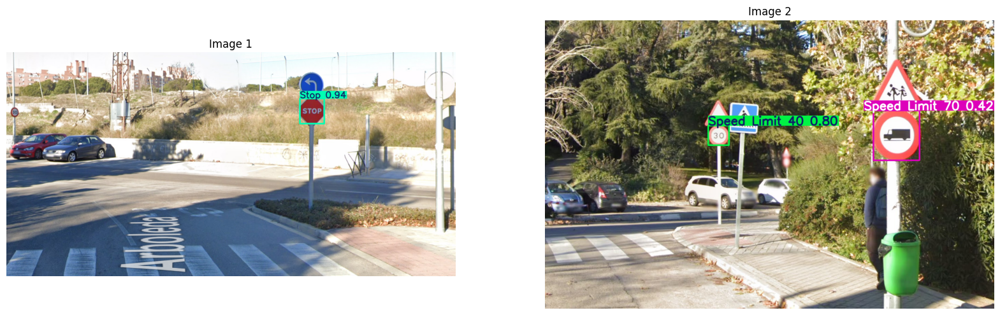

In [43]:
model_yolo = YOLO("models/YOLO/approach1.pt")
img_path = "images/67.png"
img_path2 = "images/66.png"

img = load_img(img_path)
img2 = load_img(img_path2)

results = model_yolo(img, conf=0.25, agnostic_nms=True)
results2 = model_yolo(img2, conf=0.25, agnostic_nms=True)

fig, axs = plt.subplots(1, 2, figsize=(20, 10))

for r in results:
    im_array = r.plot()

    # Plot first image
    axs[0].imshow(cv2.cvtColor(im_array, cv2.COLOR_BGR2RGB))
    axs[0].set_title("Image 1")
    axs[0].axis('off')

    # Plot second image
for r in results2:
    im_array2 = r.plot()

    axs[1].imshow(cv2.cvtColor(im_array2, cv2.COLOR_BGR2RGB))
    axs[1].set_title("Image 2")
    axs[1].axis('off')

    plt.show()

Este primer modelo solo detecta señales de velocidad y Stop, y aun asi, no es demasiado preciso con las mismas, como se puede apreciar sobre todo en *Image 2*. Por lo tanto, este modelo no es válido para nuestro objetivo. Se va a intentar encontar un modelo que detecte más tipos de señales, ya que la precisión no es tan importante para nosotros, pues como se ha mencionado anteriormente todas las señales detectadas se considerarán sin tipo.

## Segundo Modelo


0: 320x640 1 speed limit 30 (prohibitory), 1 keep right (mandatory), 42.3ms
Speed: 2.0ms preprocess, 42.3ms inference, 0.0ms postprocess per image at shape (1, 3, 320, 640)

0: 416x640 1 speed limit 30 (prohibitory), 1 speed limit 50 (prohibitory), 1 snow (danger), 35.5ms
Speed: 2.0ms preprocess, 35.5ms inference, 0.0ms postprocess per image at shape (1, 3, 416, 640)


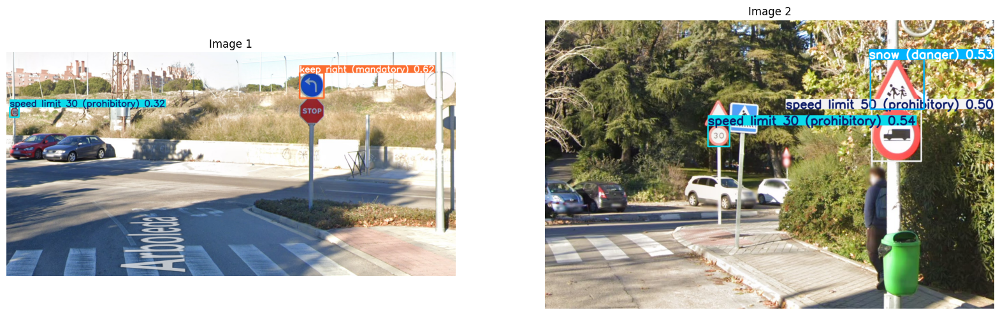

In [44]:
model_yolo = YOLO("models/YOLO/approach2.pt")
img_path = "images/67.png"
img_path2 = "images/66.png"

img = load_img(img_path)
img2 = load_img(img_path2)

results = model_yolo(img, conf=0.25, agnostic_nms=True)
results2 = model_yolo(img2, conf=0.25, agnostic_nms=True)

fig, axs = plt.subplots(1, 2, figsize=(20, 10))

for r in results:
    im_array = r.plot()

    # Plot first image
    axs[0].imshow(cv2.cvtColor(im_array, cv2.COLOR_BGR2RGB))
    axs[0].set_title("Image 1")
    axs[0].axis('off')

    # Plot second image
for r in results2:
    im_array2 = r.plot()

    axs[1].imshow(cv2.cvtColor(im_array2, cv2.COLOR_BGR2RGB))
    axs[1].set_title("Image 2")
    axs[1].axis('off')

    plt.show()

Este segundo modelo detecta más tipos de señales que el anterior, pero sigue estando muy limitado, por lo que sigue sin ser suficiente para nuestro objetivo.

## Tercer Modelo


0: 320x640 1 prohibitory, 1 mandatory, 1 other, 81.7ms
Speed: 1.7ms preprocess, 81.7ms inference, 0.0ms postprocess per image at shape (1, 3, 320, 640)

0: 416x640 2 prohibitorys, 3 dangers, 98.5ms
Speed: 2.0ms preprocess, 98.5ms inference, 0.0ms postprocess per image at shape (1, 3, 416, 640)


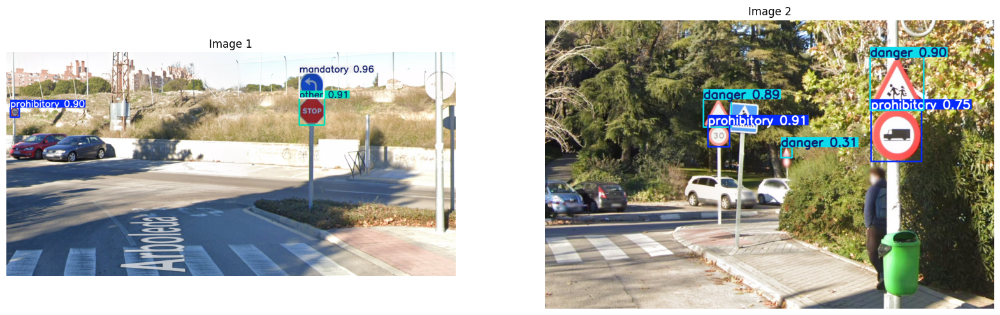

In [45]:
model_yolo = YOLO("models/YOLO/approach3.pt")
img_path = "images/67.png"
img_path2 = "images/66.png"

img = load_img(img_path)
img2 = load_img(img_path2)

results = model_yolo(img, conf=0.25, agnostic_nms=True)
results2 = model_yolo(img2, conf=0.25, agnostic_nms=True)

fig, axs = plt.subplots(1, 2, figsize=(20, 10))

for r in results:
    im_array = r.plot()

    # Plot first image
    axs[0].imshow(cv2.cvtColor(im_array, cv2.COLOR_BGR2RGB))
    axs[0].set_title("Image 1")
    axs[0].axis('off')

    # Plot second image
for r in results2:
    im_array2 = r.plot()

    axs[1].imshow(cv2.cvtColor(im_array2, cv2.COLOR_BGR2RGB))
    axs[1].set_title("Image 2")
    axs[1].axis('off')

    plt.show()

El tercer modelo detecta prácticamente todas las señales existentes en la imagen, a excepción de las señales informativas. Sin embargo, la no detección de este tipo no afecta para nuestra aplicación, pues en el dataset escogido para la clasificación posterior de las señales no hay ninguna de tipo informativa. Este modelo cumple con todos los requisitos para ser apto para nuestro objetivo, por lo que se trabajará con él de ahora en adelante.

# 5. Modelos de Clasificación

## Primer Modelo

Se crea un primer modelo sencillo para ver qué tal salen los resultados. Este está compuesto por 3 capas convolucionales y dos capas densas

In [46]:
# Reescalado de las imágenes a 50x50
def resize_image(img_path):
    img = Image.open(img_path)
    img = ImageOps.fit(img, IMG_SIZE, Image.LANCZOS)
    return img

# Reescalado en el dataset de entrenamiento
train_df["ResizedPath"] = train_df["Path"].apply(lambda x: x.replace("Train", "ResizedTrain"))
os.makedirs(os.path.join(path, "ResizedTrain"), exist_ok=True)

for i in range(len(train_df)):
    img_path = os.path.join(path, train_df.iloc[i]["Path"])
    resized_img_path = os.path.join(path, train_df.iloc[i]["ResizedPath"])
    os.makedirs(os.path.dirname(resized_img_path), exist_ok=True)
    resized_img = resize_image(img_path)
    resized_img.save(resized_img_path)

# Reescalado en el dataset de test
test_df["ResizedPath"] = test_df["Path"].apply(lambda x: x.replace("Test", "ResizedTest"))
os.makedirs(os.path.join(path, "ResizedTest"), exist_ok=True)

for i in range(len(test_df)):
    img_path = os.path.join(path, test_df.iloc[i]["Path"])
    resized_img_path = os.path.join(path, test_df.iloc[i]["ResizedPath"])
    os.makedirs(os.path.dirname(resized_img_path), exist_ok=True)
    resized_img = resize_image(img_path)
    resized_img.save(resized_img_path)

# Mostrar el shape de las imágenes redimensionadas
img = Image.open(os.path.join(path, train_df.iloc[0]["ResizedPath"]))
print("Resized image shape:", np.array(img).shape)

Resized image shape: (50, 50, 3)


In [47]:
# Normalización de las imágenes
def load_image(img_path):
    img = Image.open(img_path)
    img = np.array(img) / 255.0
    return img

# Cargar las imágenes y las etiquetas
def load_images(df):
    images = []
    labels = []

    for i in range(len(df)):
        img_path = os.path.join(path, df.iloc[i]["ResizedPath"])
        img = load_image(img_path)
        images.append(img)
        labels.append(df.iloc[i]["ClassId"])

    return np.array(images), np.array(labels)

X_train, y_train = load_images(train_df)
X_test, y_test = load_images(test_df)

In [48]:
# 3 capas convolcionales con max pooling, 2 capas densas y una capa de dropout

model = Sequential([
    Conv2D(32, (3, 3), activation="relu", input_shape=X_train.shape[1:]),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu"),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation="relu"),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.5),
    Dense(43, activation="softmax")
])

# Compilación del modelo
model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_11 (Conv2D)              │ (None, 48, 48, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 24, 24, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 22, 22, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 11, 11, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 9, 9, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 43)             │         5,547 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 361,067 (1.38 MB)

 Trainable params: 361,067 (1.38 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# # Entrenamiento del modelo
# with tf.device('/GPU:0'):
#     history = model.fit(X_train, y_train, batch_size = BATCH_SIZE, epochs = 30, validation_data = (X_test, y_test))

# model.save('traffic_sign_model.keras')

# with open('traffic_sign_model.pkl', 'wb') as file:
#     pickle.dump(history.history, file)

In [ ]:
# Carga del modelo y del historial
model = keras.models.load_model("models/CNN/traffic_sign_model.keras")

with open('models/CNN/traffic_sign_model.pkl', 'rb') as f:
    history = pickle.load(f)

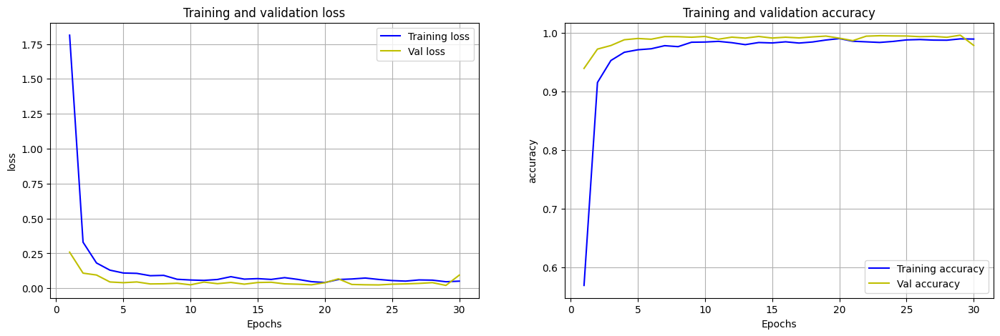

In [51]:
# Gráfico del historial de entrenamiento
plot(history, 30, 'accuracy')

#### Prueba del modelo con imágenes reales

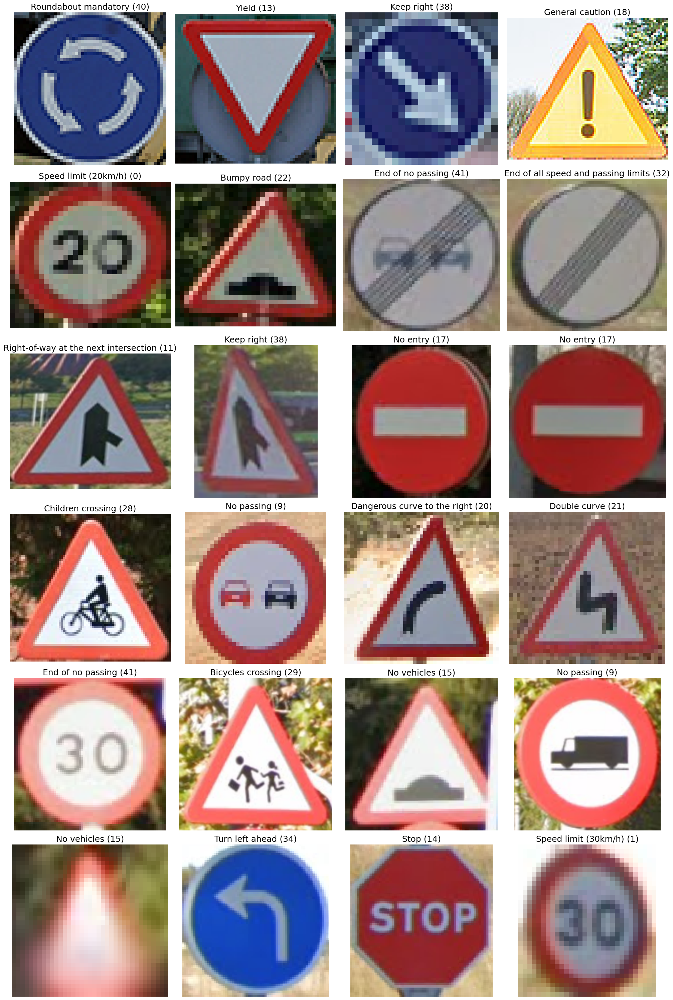

In [52]:
# Modelos
model_yolo = YOLO("models/YOLO/approach3.pt")
model = tf.keras.models.load_model("models/CNN/traffic_sign_model.keras")

# Lista de imágenes
image_names = [
    "31.jpg", "32.jpg", "40.png", "42.png", "43.png",
    "45.png", "54.png","60.png", "62.png",
    "63.png", "64.png", "66.png", "67.png"
]

# Crear figura para los subplots
cols = 4 
rows = 6
fig, axs = plt.subplots(rows, cols, figsize=(20, rows * 5))

# Iterar sobre las imágenes
plot_idx = 0 
for img_name in image_names:
    img_path = os.path.join("images", img_name)  # Asegúrate de que el path sea correcto
    img = load_img(img_path)
    results = model_yolo(img, conf=0.25, agnostic_nms=True, verbose=False)

    img = img_to_array(img).astype("uint8")

    # Procesar cada caja detectada por YOLO
    for box in results[0].boxes:
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
        cropped_img = img[y1:y2, x1:x2]  # Imagen recortada

        resized_img = tf.image.resize(cropped_img, (43, 43)) / 255.0
        resized_img = np.expand_dims(resized_img, axis=0)

        # Predecir la clase
        pred = np.argmax(model.predict(resized_img, verbose=0), axis=-1)

        ax = axs[plot_idx // cols, plot_idx % cols]
        ax.imshow(cropped_img, cmap="gray")
        ax.set_title(f"{labels.get(pred[0], 'Desconocida')} ({pred[0]})", fontsize=18)
        ax.axis('off')

        plot_idx += 1


for i in range(plot_idx, rows * cols):
    axs[i // cols, i % cols].axis('off')

plt.tight_layout()
plt.show()

Se puede apreciar que algunos ejemplos no están bien clasificados, por lo que se intenterá mejorar el modelo

## Segundo Modelo

In [53]:
# Modelo
model = Sequential()
model.add(Conv2D(filters = 32, kernel_size = (5, 5), activation = 'relu', input_shape = X_train.shape[1:]))
model.add(BatchNormalization())
model.add(Conv2D(filters = 64, kernel_size = (5, 5), activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size = (2, 2)))
model.add(Dropout(rate = 0.15))
model.add(Conv2D(filters = 128, kernel_size = (3, 3), activation = 'relu'))
model.add(BatchNormalization())
model.add(Conv2D(filters = 256, kernel_size = (3, 3), activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size = (2, 2)))
model.add(Dropout(rate = 0.20))
model.add(Flatten())
model.add(Dense(512, activation = 'relu'))
model.add(Dropout(rate = 0.25))
model.add(Dense(256, activation = 'relu'))
model.add(Dropout(rate = 0.25))
model.add(Dense(43, activation = 'softmax'))

# Compilación del modelo
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy', 'precision', 'f1_score'])
model.summary() 

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_14 (Conv2D)              │ (None, 46, 46, 32)     │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 46, 46, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 42, 42, 64)     │        51,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 42, 42, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 21, 21, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 21, 21, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 19, 19, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 19, 19, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 17, 17, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 17, 17, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 512)            │     8,389,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 43)             │        11,051 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,956,139 (34.16 MB)

 Trainable params: 8,955,179 (34.16 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# # Entrenamiento del modelo
# with tf.device('/GPU:0'):
#     history = model.fit(X_train, y_train, batch_size = BATCH_SIZE, epochs = 30, validation_data = (X_test, y_test))

# model.save('models/CNN/traffic_sign_best_model.keras')

# with open('models/CNN/traffic_sign_best_model.pkl', 'wb') as file:
#     pickle.dump(history.history, file)

In [ ]:
# Carga del modelo y del historial
model = keras.models.load_model("models/CNN/traffic_sign_best_model.keras")

with open('models/CNN/traffic_sign_best_model.pkl', 'rb') as f:
    history = pickle.load(f)

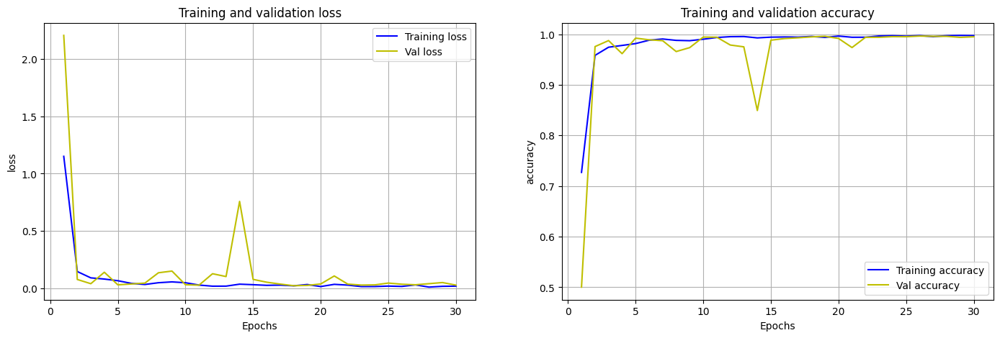

In [56]:
# Carga del modelo y del historial
plot(history, 30, 'accuracy')

#### Prueba del modelo con imágenes reales

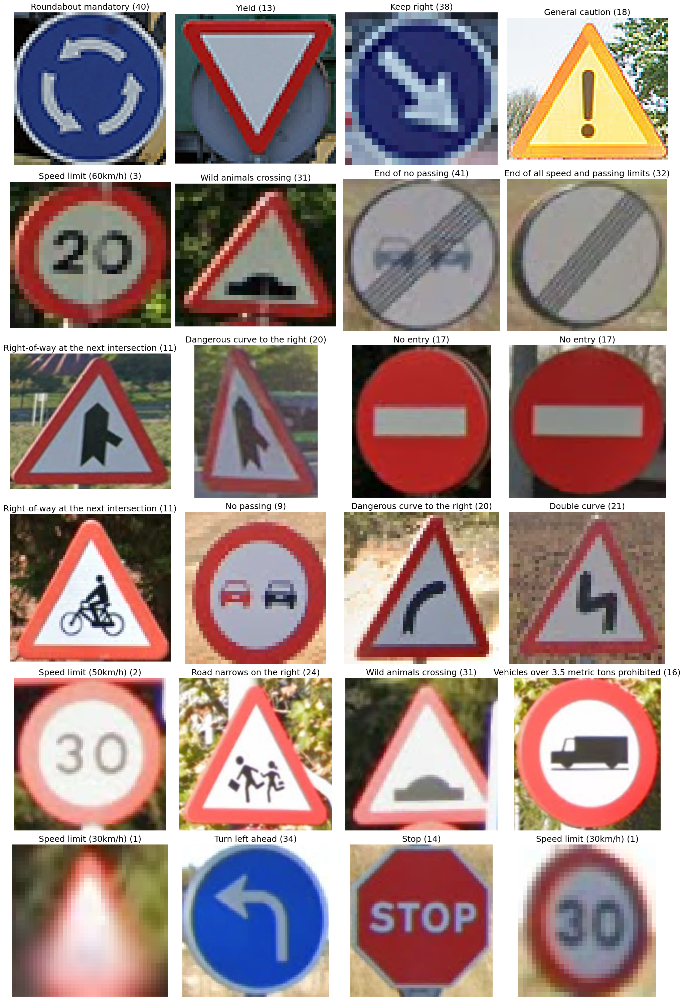

In [ ]:
# Modelos
model_yolo = YOLO("models/YOLO/approach3.pt")
model = tf.keras.models.load_model("models/CNN/traffic_sign_best_model.keras")

# Lista de imágenes
image_names = [
    "31.jpg", "32.jpg", "40.png", "42.png", "43.png",
    "45.png", "54.png","60.png", "62.png",
    "63.png", "64.png", "66.png", "67.png"
]

# Crear figura para los subplots
cols = 4 
rows = 6
fig, axs = plt.subplots(rows, cols, figsize=(20, rows * 5))

# Iterar sobre las imágenes
plot_idx = 0 
for img_name in image_names:
    img_path = os.path.join("images", img_name)  # Asegúrate de que el path sea correcto
    img = load_img(img_path)
    results = model_yolo(img, conf=0.25, agnostic_nms=True, verbose=False)

    img = img_to_array(img).astype("uint8")

    # Procesar cada caja detectada por YOLO
    for box in results[0].boxes:
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
        cropped_img = img[y1:y2, x1:x2]  # Imagen recortada

        resized_img = tf.image.resize(cropped_img, IMG_SIZE) / 255.0
        resized_img = np.expand_dims(resized_img, axis=0)

        # Predecir la clase
        pred = np.argmax(model.predict(resized_img, verbose=0), axis=-1)

        ax = axs[plot_idx // cols, plot_idx % cols]
        ax.imshow(cropped_img, cmap="gray")
        ax.set_title(f"{labels.get(pred[0], 'Desconocida')} ({pred[0]})", fontsize=18)
        ax.axis('off')

        plot_idx += 1


for i in range(plot_idx, rows * cols):
    axs[i // cols, i % cols].axis('off')

plt.tight_layout()
plt.show()

Este modelo sigue teniendo aciertos, pero también muchos errores, por lo que no nos sirve. Vamos a entrenar otro modelo cambiando el preprocesamiento de las imágenes

### Tercer Modelo (CLAHE + BW)

Los datos con los que estamos entrenando el modelo presentan dos problemas. Las imágenes tienen poca resolución, y además su contraste es pobre, por lo que aplicaremos el método CLAHE para mejorar su contraste, además probaremos también a pasar las imágenes a blanco y negro para que se fije más en la forma de cada señal y no tanto en el color. Además, las etiquetas se van a pasar a formato one-hot enconding

Se va a mostrar este preprocesamiento con una imagen del dataset para ver la diferencia con modelos anteriores, y posteriormente, se va a aplicar a todos los datos de entrenamiento.

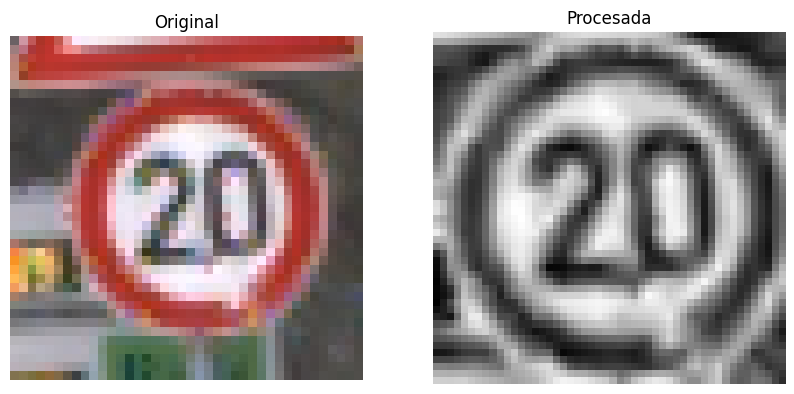

In [58]:
# Cargar la imagen
img_path = "C:/Users/raula/.cache/kagglehub/datasets/meowmeowmeowmeowmeow/gtsrb-german-traffic-sign/versions/1/Train/0/00000_00000_00013.png"
# img_path = "C:/Users/antonio/.cache/kagglehub/datasets/meowmeowmeowmeowmeow/gtsrb-german-traffic-sign/versions/1/Train/0/00000_00000_00013.png"
img = load_img(img_path)
img = img_to_array(img).astype("uint8")

# Convertir a escala de grises
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Aplicar CLAHE
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_img = clahe.apply(gray_img)

# Recortar la imagen (cropping)
x1, y1, x2, y2 = 6, 5, 35, 34
cropped_img = clahe_img[y1:y2, x1:x2]

resized_img = tf.image.resize(cropped_img[..., None], IMG_SIZE) / 255.0  # Agregar canal para TensorFlow

# Mostrar las imágenes
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(img, cmap='gray')
ax[0].set_title("Original")
ax[0].axis('off')
ax[1].imshow(resized_img, cmap='gray')
ax[1].set_title("Procesada")
ax[1].axis('off')
plt.show()

Se puede apreciar que el cambio es bastante grande, además de parecerse en mayor medida a los recortes que obtiene el modelo de YOLO elegido

In [59]:
# Función para cargar y preprocesar imágenes
def preprocess_images(df, base_path):
    images = []
    labels = []

    for _, row in tqdm(df.iterrows(), total=df.shape[0]):

        # Cargar imagen
        img_path = os.path.join(base_path, row['Path'])
        img = load_img(img_path)
        img_array = img_to_array(img).astype("uint8")

        # Convertir a escala de grises
        gray_img = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)

        # Convertir al espacio de color YUV
        yuv_img = cv2.cvtColor(img_array, cv2.COLOR_RGB2YUV)

        # Aplicar CLAHE
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        clahe_img = clahe.apply(gray_img)
        yuv_img[..., 0] = clahe.apply(yuv_img[..., 0])  # Modificar solo el canal Y

        # Recortar usando las coordenadas ROI
        x1, y1, x2, y2 = row['Roi.X1'], row['Roi.Y1'], row['Roi.X2'], row['Roi.Y2']

        cropped_img = clahe_img[y1:y2, x1:x2]

        # Redimensionar y normalizar
        resized_img = tf.image.resize(cropped_img[..., None], IMG_SIZE) / 255.0

        # Almacenar en las listas
        images.append(resized_img)
        labels.append(row['ClassId'])

    return np.array(images), np.array(labels)

In [60]:
# Cargar datos
train_images, train_labels = preprocess_images(train_df, base_path=path)
test_images, test_labels = preprocess_images(test_df, base_path=path)

100%|██████████| 12630/12630 [00:25<00:00, 490.44it/s]


In [61]:
# One-hot encoding de las etiquetas
train_labels = to_categorical(train_labels, NUM_CLASSES)
test_labels = to_categorical(test_labels, NUM_CLASSES)

Se muestra la distribución de las imágenes por categoría para detectar problemas de balanceo en el dataset

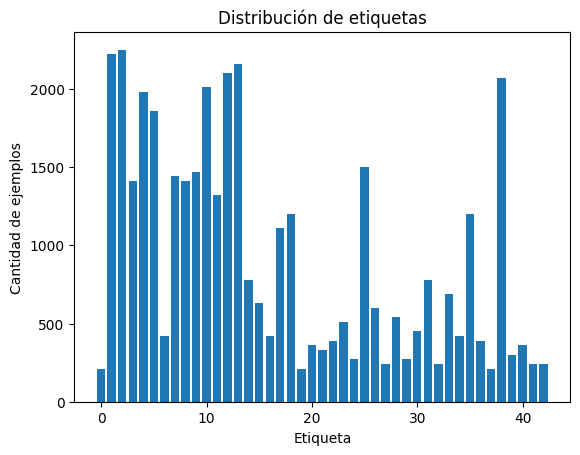

In [62]:
# Convertir las etiquetas one-hot de nuevo a formato original
original_train_labels = np.argmax(train_labels, axis=1)

# Contar la frecuencia de cada etiqueta
labels_aux, counts = np.unique(original_train_labels, return_counts=True)

# Graficar la distribución de etiquetas
plt.bar(labels_aux, counts)
plt.xlabel("Etiqueta")
plt.ylabel("Cantidad de ejemplos")
plt.title("Distribución de etiquetas")
plt.show()

El dataset se encuentra completamente desbalanceado. Se va proceder a su balanceo mediante la técnica de *Data Augmentation*

In [63]:
# Equilibrar las clases usando ImageDataGenerator
class_counts = Counter(np.argmax(train_labels, axis=1))
max_count = max(class_counts.values())

# Crear generadores para equilibrar
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    fill_mode='nearest'
)

balanced_train_images = []
balanced_train_labels = []

for class_id, count in class_counts.items():
    # Filtrar imágenes y etiquetas de la clase actual
    class_images = train_images[np.argmax(train_labels, axis=1) == class_id]
    class_labels = train_labels[np.argmax(train_labels, axis=1) == class_id]

    # Añadir imágenes existentes
    balanced_train_images.extend(class_images)
    balanced_train_labels.extend(class_labels)

    # Generar imágenes adicionales
    num_to_generate = max_count - count
    generated_count = 0  # Contador de imágenes generadas para esta clase

    for batch in datagen.flow(class_images, class_labels, batch_size=1):
        balanced_train_images.append(batch[0][0])
        balanced_train_labels.append(batch[1][0])
        generated_count += 1

        # Romper el bucle una vez que se hayan generado suficientes imágenes
        if generated_count >= num_to_generate:
            break

# Convertir las listas a arrays numpy
balanced_train_images = np.array(balanced_train_images)
balanced_train_labels = np.array(balanced_train_labels)

print(f"Imágenes totales equilibradas: {len(balanced_train_images)}")

Imágenes totales equilibradas: 96751


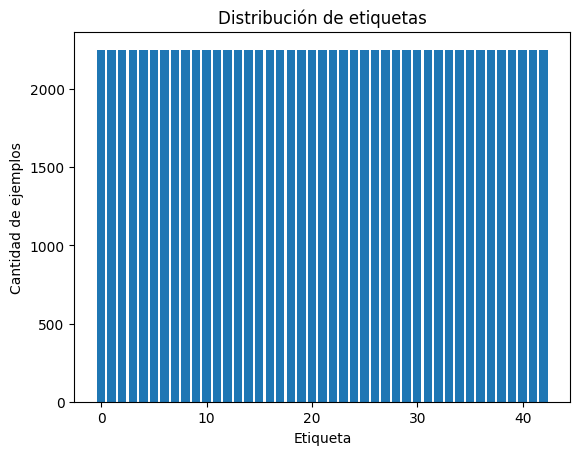

In [64]:
# Convertir las etiquetas one-hot de nuevo a formato original
original_train_labels = np.argmax(balanced_train_labels, axis=1)

# Contar la frecuencia de cada etiqueta
labels_aux, counts = np.unique(original_train_labels, return_counts=True)


# Graficar la distribución de etiquetas
plt.bar(labels_aux, counts)
plt.xlabel("Etiqueta")
plt.ylabel("Cantidad de ejemplos")
plt.title("Distribución de etiquetas")
plt.show()

Ahora el dataset se encuentra perfectamente desbalanceado, y presumiblemente, los modelos tendrán un mejor rendimiento

In [65]:
X_train, X_test, y_train, y_test = balanced_train_images, test_images, balanced_train_labels, test_labels
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(96751, 50, 50, 1) (12630, 50, 50, 1) (96751, 43) (12630, 43)


In [66]:
# Modelo
model = Sequential()
model.add(Conv2D(filters = 32, kernel_size = (5, 5), activation = 'relu', input_shape = X_train.shape[1:]))
model.add(BatchNormalization())
model.add(Conv2D(filters = 64, kernel_size = (5, 5), activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size = (2, 2)))
model.add(Dropout(rate = 0.15))
model.add(Conv2D(filters = 128, kernel_size = (3, 3), activation = 'relu'))
model.add(BatchNormalization())
model.add(Conv2D(filters = 256, kernel_size = (3, 3), activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size = (2, 2)))
model.add(Dropout(rate = 0.20))
model.add(Flatten())
model.add(Dense(512, activation = 'relu'))
model.add(Dropout(rate = 0.25))
model.add(Dense(256, activation = 'relu'))
model.add(Dropout(rate = 0.25))
model.add(Dense(43, activation = 'softmax'))

# Compilación del modelo
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_18 (Conv2D)              │ (None, 46, 46, 32)     │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 46, 46, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 42, 42, 64)     │        51,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 42, 42, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 21, 21, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 21, 21, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 19, 19, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 19, 19, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 17, 17, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 17, 17, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 512)            │     8,389,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 43)             │        11,051 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,954,539 (34.16 MB)

 Trainable params: 8,953,579 (34.16 MB)

 Non-trainable params: 960 (3.75 KB)

In [67]:
# # Entrenamiento del modelo
# with tf.device('/GPU:0'):
#     history = model.fit(X_train, y_train, batch_size = BATCH_SIZE, epochs = EPOCHS, validation_data = (X_test, y_test))

# model.save('best_model.keras')

# with open('best_history.pkl', 'wb') as file:
#     pickle.dump(history.history, file)

In [68]:
# Carga del modelo y del historial
model = keras.models.load_model("models/CNN/clahe_bw.keras")

with open('models/CNN/clahe_bw.pkl', 'rb') as f:
    history = pickle.load(f)

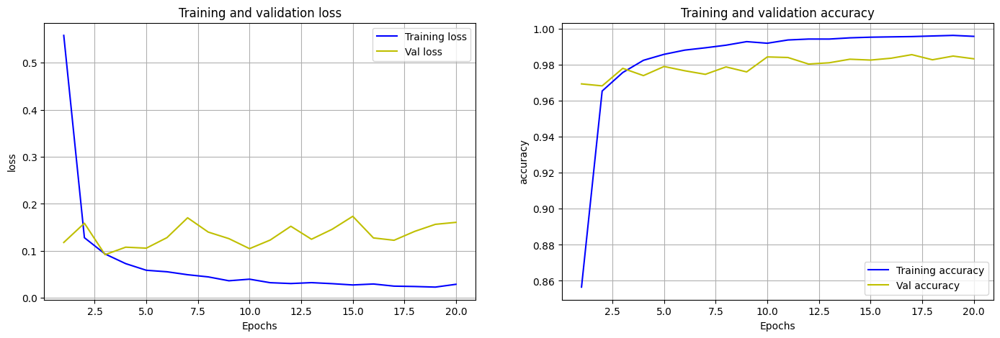

In [69]:
# Gráfico del historial de entrenamiento
plot(history, EPOCHS, 'accuracy')

In [70]:
# Test del modelo
print(f"Test accuracy: {model.evaluate(X_test, y_test)[1]*100:.2f} %")

395/395 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - accuracy: 0.9839 - loss: 0.1615
Test accuracy: 98.33 %


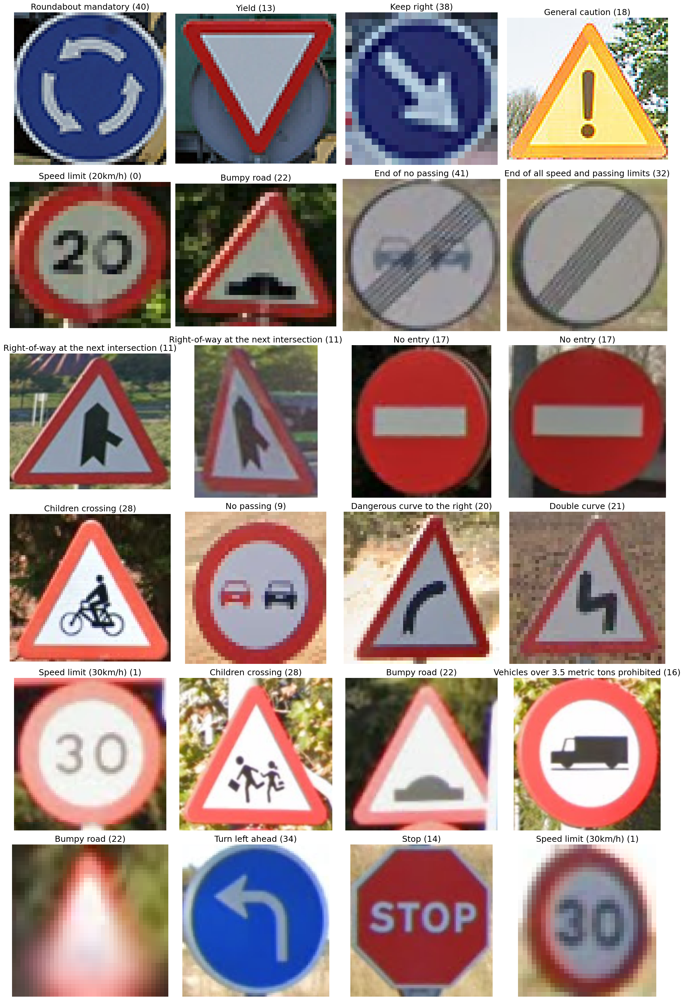

In [71]:
# Modelos
model_yolo = YOLO("models/YOLO/approach3.pt")
model = tf.keras.models.load_model("models/CNN/clahe_bw.keras")

# Lista de imágenes
image_names = [
    "31.jpg", "32.jpg", "40.png", "42.png", "43.png",
    "45.png", "54.png","60.png", "62.png",
    "63.png", "64.png", "66.png", "67.png"
]

# Crear figura para los subplots
cols = 4
rows = 6
fig, axs = plt.subplots(rows, cols, figsize=(20, rows * 5))

# Iterar sobre las imágenes
plot_idx = 0
for img_name in image_names:
    img_path = os.path.join("images", img_name)  # Asegúrate de que el path sea correcto
    img = load_img(img_path)
    results = model_yolo(img, conf=0.25, agnostic_nms=True, verbose=False)

    # Convertir imagen a array y escala de grises
    img = img_to_array(img).astype("uint8")
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Aplicar CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_img = clahe.apply(gray_img)

    # Procesar cada caja detectada por YOLO
    for box in results[0].boxes:
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
        cropped_img = clahe_img[y1:y2, x1:x2]  # Imagen recortada

        aux = img[y1:y2, x1:x2]

        # Redimensionar la imagen
        resized_img = tf.image.resize(cropped_img[..., None], IMG_SIZE) / 255.0
        resized_img = np.expand_dims(resized_img, axis=0)

        # Predecir la clase
        pred = np.argmax(model.predict(resized_img, verbose=0), axis=-1)

        # Mostrar la imagen recortada en el subplot correspondiente
        ax = axs[plot_idx // cols, plot_idx % cols]  # Elegir el subplot basado en el índice
        ax.imshow(aux, cmap="gray")
        ax.set_title(f"{labels.get(pred[0], 'Desconocida')} ({pred[0]})", fontsize=18)
        ax.axis('off')

        plot_idx += 1

# Ocultar ejes sobrantes si hay menos imágenes que subplots
for i in range(plot_idx, rows * cols):
    axs[i // cols, i % cols].axis('off')

# Ajustar el diseño
plt.tight_layout()
plt.show()

Los resultados son muy buenos, pues predice bien prácticamente todas las señales, salvo una. La señal mal predicha es debido a que los modelos han sido entrenados con imagenes de señales de tráfico alemanas y ahora los estamos probando con lo que capta YOLO de imágenes del Street View de google maps de calles y señales españolas, pues dicha señal es distinta en Alemania y España.

## Cuarto Modelo (ResNet)

Vamos a probar con un último modelo *ResNet* haciendo uso de la técnica *Transfer Learning*. Este modelo se entrenará con el dataset balanceado y las imágenes contrastadas.

In [72]:
# Cargar la base del modelo preentrenado ResNet50
base_model = ResNet50(weights="imagenet", include_top=False, input_shape=(50, 50, 3))

# Congelar las capas del modelo base
base_model.trainable = False

# Añadir capas personalizadas para la clasificación
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.2)(x)
output = Dense(43, activation='softmax')(x)

# Crear el modelo final
model = Model(inputs=base_model.input, outputs=output)

# Compilación del modelo
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
# model.summary()

In [ ]:
# # Entrenamiento del modelo
# with tf.device('/GPU:0'):
#     history = model.fit(X_train, y_train, batch_size = BATCH_SIZE, epochs = EPOCHS, validation_data = (X_test, y_test))

# model.save('Resnet.keras')

# with open('Resnet.pkl', 'wb') as file:
#     pickle.dump(history.history, file)


In [ ]:
# Carga del modelo y del historial
model = keras.models.load_model("models/CNN/Resnet.keras")

with open('models/CNN/Resnet.pkl', 'rb') as f:
    history = pickle.load(f)

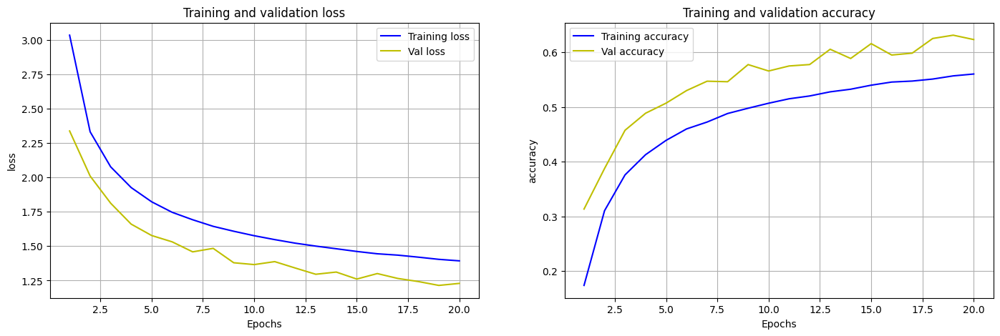

In [75]:
# Gráfico del historial de entrenamiento
plot(history, EPOCHS, 'accuracy')

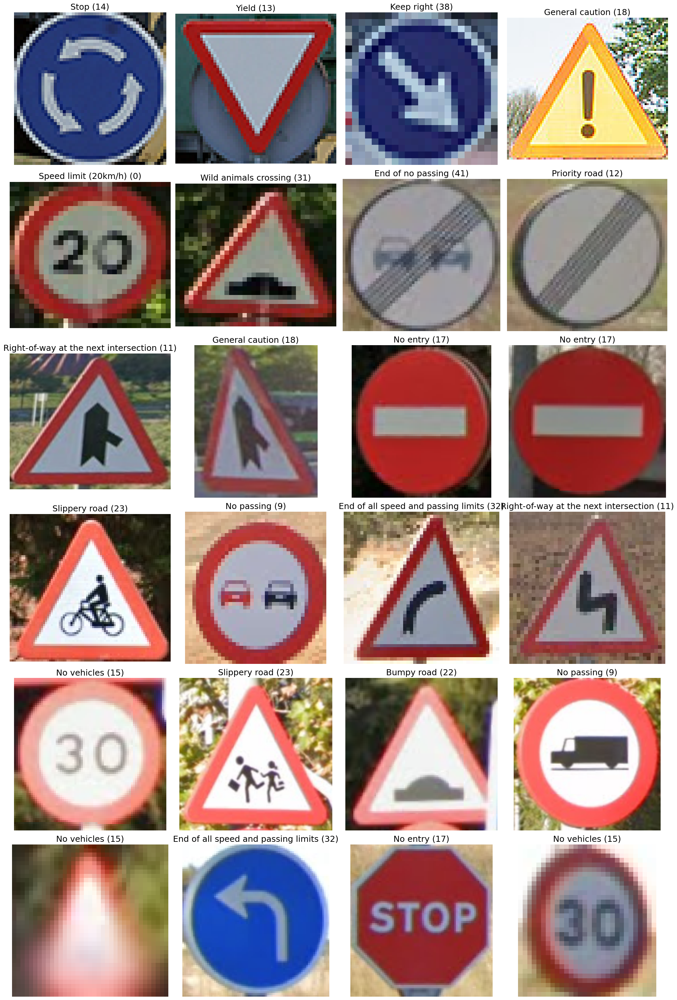

In [ ]:
# Modelos
model_yolo = YOLO("models/YOLO/approach3.pt")
model = tf.keras.models.load_model("models/CNN/Resnet.keras")

# Lista de imágenes
image_names = [
    "31.jpg", "32.jpg", "40.png", "42.png", "43.png",
    "45.png", "54.png","60.png", "62.png",
    "63.png", "64.png", "66.png", "67.png"
]

# Crear figura para los subplots
cols = 4 
rows = 6
fig, axs = plt.subplots(rows, cols, figsize=(20, rows * 5))

# Iterar sobre las imágenes
plot_idx = 0 
for img_name in image_names:
    img_path = os.path.join("images", img_name)  # Asegúrate de que el path sea correcto
    img = load_img(img_path)
    results = model_yolo(img, conf=0.25, agnostic_nms=True, verbose=False)

    # Convertir imagen a array y escala de grises
    img = img_to_array(img).astype("uint8")
    yuv_img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)

    # Aplicar CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    yuv_img[..., 0] = clahe.apply(yuv_img[..., 0])

    clahe_color_img = cv2.cvtColor(yuv_img, cv2.COLOR_YUV2RGB)

    # Procesar cada caja detectada por YOLO
    for box in results[0].boxes:
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
        cropped_img = clahe_color_img[y1:y2, x1:x2]  # Imagen recortada

        aux = img[y1:y2, x1:x2]

        # Redimensionar la imagen
        resized_img = tf.image.resize(cropped_img, IMG_SIZE) / 255.0
        resized_img = np.expand_dims(resized_img, axis=0)

        # Predecir la clase
        pred = np.argmax(model.predict(resized_img, verbose=0), axis=-1)

        # Mostrar la imagen recortada en el subplot correspondiente
        ax = axs[plot_idx // cols, plot_idx % cols]  # Elegir el subplot basado en el índice
        ax.imshow(aux, cmap="gray")
        ax.set_title(f"{labels.get(pred[0], 'Desconocida')} ({pred[0]})", fontsize=18)
        ax.axis('off')

        plot_idx += 1

for i in range(plot_idx, rows * cols):
    axs[i // cols, i % cols].axis('off')

# Ajustar el diseño
plt.tight_layout()
plt.show()

Este modelo no funciona del todo bien, como ya predecía el accuracy obtenido durante el entrenamiento. Se puede apreciar que tiene más errores que aciertos en estas imágenes de prueba.

# 6. Detección y Clasificación en Entorno Real

Una vez vistos los diferentes modelos, el mejor ha sido, sin duda, el tercer modelo, el cual combinaba una red convolucional de tamaño medio con un balanceo del dataset y un preprocesamiento exhaustivo aplicando el algoritmo CLAHE a las imágenes, además de pasarlas a un solo canal.

Veamos como quedaría la clasificación con una imagen de la carretera del campus, lugar donde grabaremos nuestro vídeo final.


0: 416x640 2 prohibitorys, 3 dangers, 103.1ms
Speed: 2.0ms preprocess, 103.1ms inference, 0.0ms postprocess per image at shape (1, 3, 416, 640)


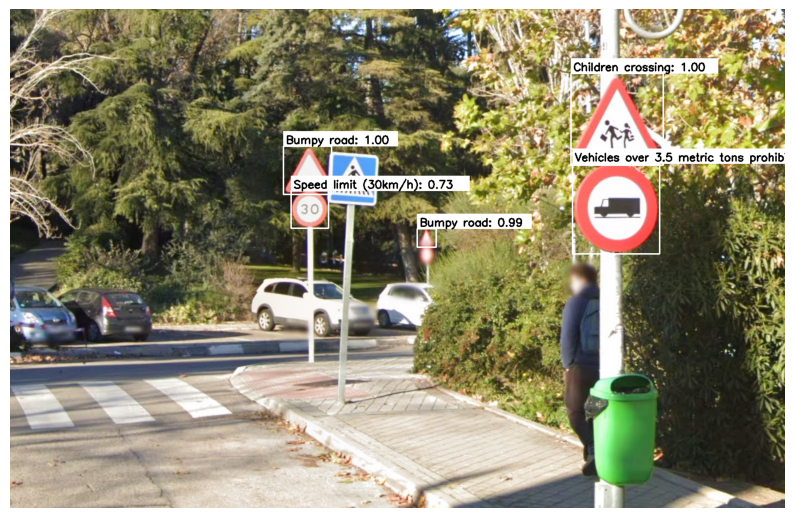

In [77]:
# Modelos
model_yolo = YOLO("models/YOLO/approach3.pt")
model = tf.keras.models.load_model("models/CNN/clahe_bw.keras")

# Leer la imagen
img = load_img("images/66.png")

# Obtener resultados del modelo YOLO
results = model_yolo(img, conf=0.25, agnostic_nms=True)

img = img_to_array(img).astype("uint8")

# Crear una copia de la imagen para visualizar las predicciones
image_with_predictions = img.copy()

# Convertir a escala de grises
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Aplicar CLAHE
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_img = clahe.apply(gray_img)

# Iterar sobre las cajas detectadas por YOLO
for box in results[0].boxes:
    x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)  # Coordenadas de la caja

    cropped_img = clahe_img[y1:y2, x1:x2]  # Recortar la región de interés

    # Preprocesar la imagen para el modelo CNN
    resized_img = tf.image.resize(cropped_img[..., None], IMG_SIZE) / 255.0

    resized_img = np.expand_dims(resized_img, axis=0)  # Añadir batch
    # resized_image = resized_image / 255.0  # Normalizar

    # Obtener predicción del modelo CNN
    predictions = model.predict(resized_img, verbose=0)[0]
    predicted_class = np.argmax(predictions, axis=-1) # Clase con mayor probabilidad
    confidence = predictions[predicted_class]  # Probabilidad en %

    # Dibujar la predicción sobre la imagen
    cv2.rectangle(image_with_predictions, (x1, y1), (x2, y2), (255, 255, 255), 2)  # Rectángulo blanco
    # Dibujar un rectángulo blanco como fondo del texto
    (text_width, text_height), baseline = cv2.getTextSize(
        f"{labels.get(predicted_class)}: {confidence:.2f}",
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        3,
    )
    cv2.rectangle(
        image_with_predictions,
        (x1, y1 - text_height - 10),
        (x1 + text_width - 10, y1),
        (255, 255, 255),
        thickness=cv2.FILLED,
    )
    # Dibujar el texto en negro encima del fondo blanco
    cv2.putText(
        image_with_predictions,
        f"{labels.get(predicted_class)}: {confidence:.2f}",
        (x1 + 5, y1 - 5),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.7,
        (0, 0, 0),
        2,
    )


# Visualizar la imagen con predicciones
plt.figure(figsize=(10, 10))
plt.imshow(image_with_predictions)
plt.axis("off")
plt.show()

## Vídeo alrededor del Campus Sur de la Universidad Politécnica de Madrid

In [ ]:
# Modelos
model_yolo = YOLO("models/YOLO/approach3.pt")
model = tf.keras.models.load_model("models/CNN/clahe_bw.keras")

# Leer el video
input_video_path = "campus.mp4"
output_video_path = "output.mp4"

cap = cv2.VideoCapture(input_video_path)

# Obtener propiedades del video
fps = int(cap.get(cv2.CAP_PROP_FPS))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec para el video de salida

# Crear el objeto VideoWriter
out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

# Procesar cada frame del video
frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break  # Fin del video

    frame_count += 1
    print(f"Procesando frame {frame_count}")

    # Obtener resultados del modelo YOLO
    results = model_yolo(frame, conf=0.8, agnostic_nms=True, verbose=False)

    img = img_to_array(frame).astype("uint8")

    # Crear una copia de la imagen para visualizar las predicciones
    image_with_predictions = img.copy()

    # Convertir a escala de grises
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Aplicar CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_img = clahe.apply(gray_img)

    # Iterar sobre las cajas detectadas por YOLO
    for box in results[0].boxes:
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)

        cropped_img = clahe_img[y1:y2, x1:x2]

        # Preprocesar la imagen para el modelo CNN
        resized_img = tf.image.resize(cropped_img[..., None], IMG_SIZE) / 255.0

        resized_img = np.expand_dims(resized_img, axis=0)  # Añadir batch

        # Obtener predicción del modelo CNN
        predictions = model.predict(resized_img, verbose=0)[0]
        predicted_class = np.argmax(predictions)
        confidence = predictions[predicted_class]

        # Dibujar la predicción sobre la imagen
        cv2.rectangle(frame, (x1, y1), (x2, y2), (255, 255, 255), 2)

        # Dibujar un rectángulo blanco como fondo del texto
        (text_width, text_height), baseline = cv2.getTextSize(
            f"{labels.get(predicted_class)}: {confidence:.2f}",
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            3,
        )
        cv2.rectangle(
            frame,
            (x1, y1 - text_height - 10),
            (x1 + text_width - 10, y1),
            (255, 255, 255),
            thickness=cv2.FILLED,
        )
        # Dibujar el texto en negro encima del fondo blanco
        cv2.putText(
            frame,
            f"{labels.get(predicted_class)}: {confidence:.2f}",
            (x1 + 5, y1 - 5),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.7,
            (0, 0, 0),
            2,
        )

    # Escribir el frame procesado en el video de salida
    out.write(frame)

cap.release()
out.release()
print(f"Video procesado guardado en {output_video_path}")

Procesando frame 1
Procesando frame 2
Procesando frame 3
Procesando frame 4
Procesando frame 5
Procesando frame 6
Procesando frame 7
Procesando frame 8
Procesando frame 9
Procesando frame 10
Procesando frame 11
Procesando frame 12
Procesando frame 13
Procesando frame 14
Procesando frame 15
Procesando frame 16
Procesando frame 17
Procesando frame 18
Procesando frame 19
Procesando frame 20
Procesando frame 21
Procesando frame 22
Procesando frame 23
Procesando frame 24
Procesando frame 25
Procesando frame 26
Procesando frame 27
Procesando frame 28
Procesando frame 29
Procesando frame 30
Procesando frame 31
Procesando frame 32
Procesando frame 33
Procesando frame 34
Procesando frame 35
Procesando frame 36
Procesando frame 37
Procesando frame 38
Procesando frame 39
Procesando frame 40
Procesando frame 41
Procesando frame 42
Procesando frame 43
Procesando frame 44
Procesando frame 45
Procesando frame 46
Procesando frame 47
Procesando frame 48
Procesando frame 49
Procesando frame 50
Procesand